In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
from tqdm.notebook import tqdm 
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import silhouette_score
import statsmodels.api as sm
from statsmodels.formula.api import ols


In [2]:
df = pd.read_csv("NY-House-Dataset.csv")

In [4]:
df.head()

,BROKERTITLE,TYPE,PRICE,BEDS,BATH,PROPERTYSQFT,ADDRESS,STATE,MAIN_ADDRESS,ADMINISTRATIVE_AREA_LEVEL_2,LOCALITY,SUBLOCALITY,STREET_NAME,LONG_NAME,FORMATTED_ADDRESS,LATITUDE,LONGITUDE
0,Brokered by Douglas Elliman -111 Fifth Ave,Condo for sale,315000,2,2.000000,1400.0,2 E 55th St Unit 803,"New York, NY 10022","2 E 55th St Unit 803New York, NY 10022",New York County,New York,Manhattan,East 55th Street,Regis Residence,"Regis Residence, 2 E 55th St #803, New York, N...",40.761255,-73.974483
1,Brokered by Serhant,Condo for sale,195000000,7,10.000000,17545.0,Central Park Tower Penthouse-217 W 57th New Yo...,"New York, NY 10019",Central Park Tower Penthouse-217 W 57th New Yo...,United States,New York,New York County,New York,West 57th Street,"217 W 57th St, New York, NY 10019, USA",40.766393,-73.980991
2,Brokered by Sowae Corp,House for sale,260000,4,2.000000,2015.0,620 Sinclair Ave,"Staten Island, NY 10312","620 Sinclair AveStaten Island, NY 10312",United States,New York,Richmond County,Staten Island,Sinclair Avenue,"620 Sinclair Ave, Staten Island, NY 10312, USA",40.541805,-74.196109
3,Brokered by COMPASS,Condo for sale,69000,3,1.000000,445.0,2 E 55th St Unit 908W33,"Manhattan, NY 10022","2 E 55th St Unit 908W33Manhattan, NY 10022",United States,New York,New York County,New York,East 55th Street,"2 E 55th St, New York, NY 10022, USA",40.761398,-73.974613
4,Brokered by Sotheby's International Realty - E...,Townhouse for sale,55000000,7,2.373861,14175.0,5 E 64th St,"New York, NY 10065","5 E 64th StNew York, NY 10065",United States,New York,New York County,New York,East 64th Street,"5 E 64th St, New York, NY 10065, USA",40.767224,-73.969856


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4801 entries, 0 to 4800
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   BROKERTITLE                  4801 non-null   object 
 1   TYPE                         4801 non-null   object 
 2   PRICE                        4801 non-null   int64  
 3   BEDS                         4801 non-null   int64  
 4   BATH                         4801 non-null   float64
 5   PROPERTYSQFT                 4801 non-null   float64
 6   ADDRESS                      4801 non-null   object 
 7   STATE                        4801 non-null   object 
 8   MAIN_ADDRESS                 4801 non-null   object 
 9   ADMINISTRATIVE_AREA_LEVEL_2  4801 non-null   object 
 10  LOCALITY                     4801 non-null   object 
 11  SUBLOCALITY                  4801 non-null   object 
 12  STREET_NAME                  4801 non-null   object 
 13  LONG_NAME         

# DATA CLEANING

In [6]:
#change the datatype of "BATH" from float to int

df['BATH']= df['BATH'].astype(int)
df.head()

,BROKERTITLE,TYPE,PRICE,BEDS,BATH,PROPERTYSQFT,ADDRESS,STATE,MAIN_ADDRESS,ADMINISTRATIVE_AREA_LEVEL_2,LOCALITY,SUBLOCALITY,STREET_NAME,LONG_NAME,FORMATTED_ADDRESS,LATITUDE,LONGITUDE
0,Brokered by Douglas Elliman -111 Fifth Ave,Condo for sale,315000,2,2,1400.0,2 E 55th St Unit 803,"New York, NY 10022","2 E 55th St Unit 803New York, NY 10022",New York County,New York,Manhattan,East 55th Street,Regis Residence,"Regis Residence, 2 E 55th St #803, New York, N...",40.761255,-73.974483
1,Brokered by Serhant,Condo for sale,195000000,7,10,17545.0,Central Park Tower Penthouse-217 W 57th New Yo...,"New York, NY 10019",Central Park Tower Penthouse-217 W 57th New Yo...,United States,New York,New York County,New York,West 57th Street,"217 W 57th St, New York, NY 10019, USA",40.766393,-73.980991
2,Brokered by Sowae Corp,House for sale,260000,4,2,2015.0,620 Sinclair Ave,"Staten Island, NY 10312","620 Sinclair AveStaten Island, NY 10312",United States,New York,Richmond County,Staten Island,Sinclair Avenue,"620 Sinclair Ave, Staten Island, NY 10312, USA",40.541805,-74.196109
3,Brokered by COMPASS,Condo for sale,69000,3,1,445.0,2 E 55th St Unit 908W33,"Manhattan, NY 10022","2 E 55th St Unit 908W33Manhattan, NY 10022",United States,New York,New York County,New York,East 55th Street,"2 E 55th St, New York, NY 10022, USA",40.761398,-73.974613
4,Brokered by Sotheby's International Realty - E...,Townhouse for sale,55000000,7,2,14175.0,5 E 64th St,"New York, NY 10065","5 E 64th StNew York, NY 10065",United States,New York,New York County,New York,East 64th Street,"5 E 64th St, New York, NY 10065, USA",40.767224,-73.969856


In [10]:
# Check for the null values in the dataframe
df.isnull()
df.isnull().sum()

BROKERTITLE                    0
TYPE                           0
PRICE                          0
BEDS                           0
BATH                           0
PROPERTYSQFT                   0
ADDRESS                        0
STATE                          0
MAIN_ADDRESS                   0
ADMINISTRATIVE_AREA_LEVEL_2    0
LOCALITY                       0
SUBLOCALITY                    0
STREET_NAME                    0
LONG_NAME                      0
FORMATTED_ADDRESS              0
LATITUDE                       0
LONGITUDE                      0
dtype: int64

In [11]:
# Identify the total number of duplicates in a dataframe
df.duplicated().sum()


214

In [12]:
# We cannot have duplicate addresses so remove the duplicate rows based on "ADDRESS" column
df.drop_duplicates(subset=['ADDRESS'], inplace=True)
# check for the duplicates again
df.duplicated().sum()


0

# Exploratory Data Analysis (EDA)

In [18]:
# Descriptive analysis

print("Summary Statistics:")
df.describe()

Summary Statistics:


,PRICE,BEDS,BATH,PROPERTYSQFT,LATITUDE,LONGITUDE
count,4.582000e+03,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000
mean,2.381709e+06,3.360978,2.352030,2176.471515,40.713996,-73.941501
std,3.208579e+07,2.624625,1.969932,2283.751257,0.087692,0.101214
min,2.494000e+03,1.000000,0.000000,230.000000,40.499546,-74.253033
25%,4.990000e+05,2.000000,1.000000,1200.000000,40.638651,-73.987387
50%,8.250000e+05,3.000000,2.000000,2184.207862,40.726691,-73.949116
75%,1.495000e+06,4.000000,3.000000,2184.207862,40.771913,-73.869418
max,2.147484e+09,50.000000,50.000000,65535.000000,40.912729,-73.702450


In [19]:
print("Unique Values:")
df.nunique()

Unique Values:


BROKERTITLE                    1035
TYPE                             13
PRICE                          1274
BEDS                             27
BATH                             21
PROPERTYSQFT                   1444
ADDRESS                        4582
STATE                           308
MAIN_ADDRESS                   4582
ADMINISTRATIVE_AREA_LEVEL_2      29
LOCALITY                         11
SUBLOCALITY                      21
STREET_NAME                     174
LONG_NAME                      2731
FORMATTED_ADDRESS              4550
LATITUDE                       4196
LONGITUDE                      4118
dtype: int64

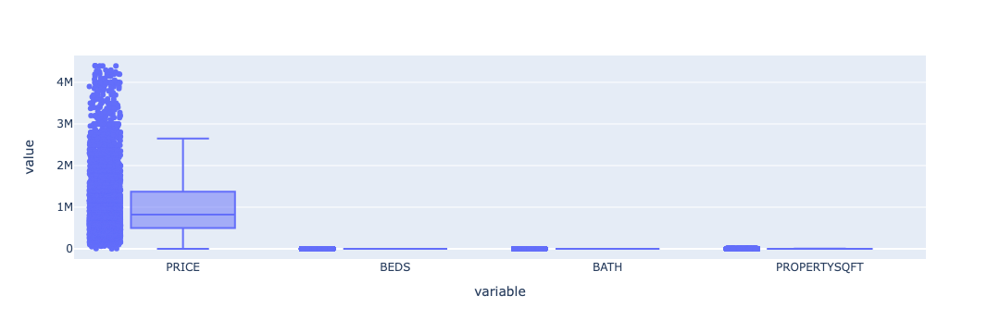

In [25]:
#  Outlier detection and eliminating them by replacing them with mean of the numerical columns

# Step 1: Create box plots for all numeric columns
fig = px.box(df, y=['PRICE','BEDS','BATH','PROPERTYSQFT'], points="all")

# Step 2: Show the plot
fig.show()

# Specify the columns for outlier handling
numerical_columns = ['PRICE', 'BEDS', 'BATH', 'PROPERTYSQFT']

# Step 1: Calculate mean and standard deviation for each column
means = df[numerical_columns].mean()
std_devs = df[numerical_columns].std()

# Step 2: Define a threshold for identifying outliers (e.g., Z-score > 3 or < -3)
z_score_threshold = 3

# Step 3: Identify and handle outliers
for column in numerical_columns:
    z_scores = (df[column] - means[column]) / std_devs[column]
    outliers_mask = abs(z_scores) > z_score_threshold
    
    # Replace outliers with the mean
    df.loc[outliers_mask, column] = means[column]



Plotting distributions:   0%|          | 0/4 [00:00<?, ?it/s]

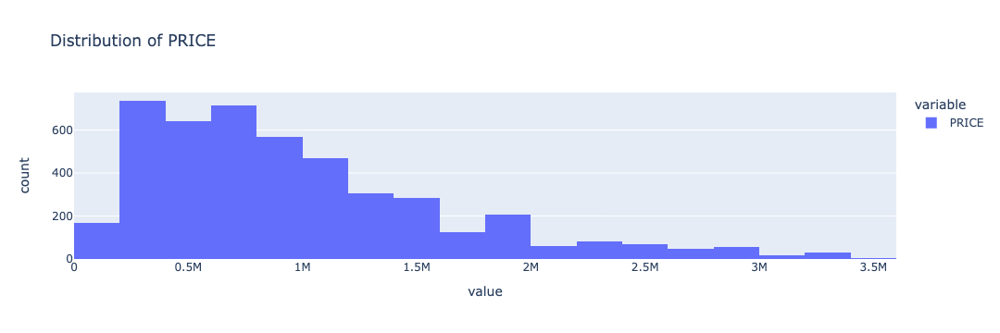

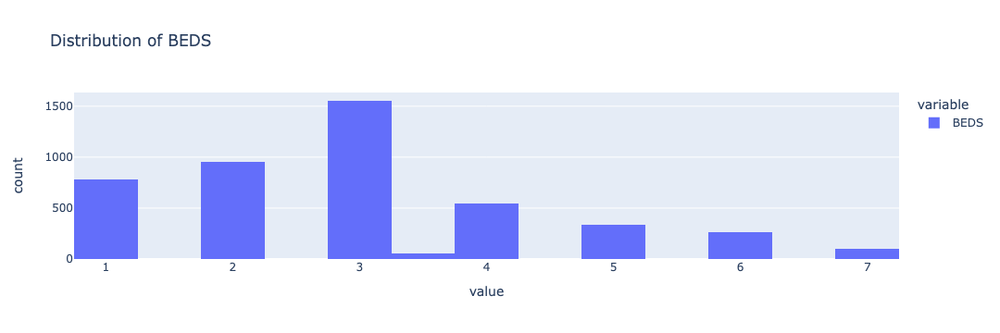

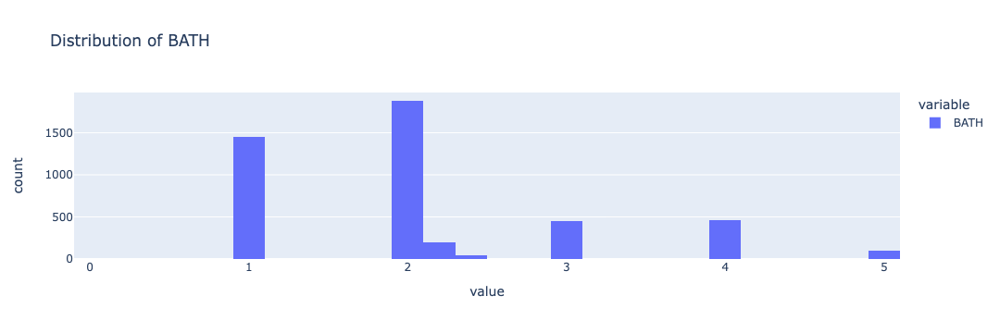

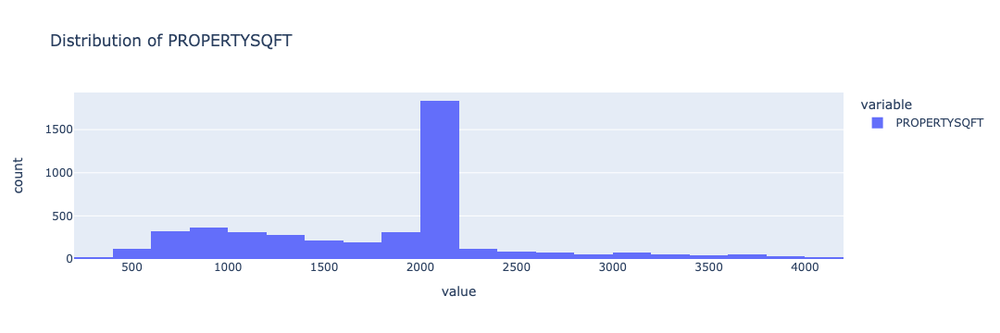

In [27]:
# Histograms and box plots to visualize the distribution of numerical columns

for column in tqdm(numerical_columns, desc='Plotting distributions'):
    fig = px.histogram(df[column].dropna(), nbins=30, title='Distribution of ' + column)
    fig.show()

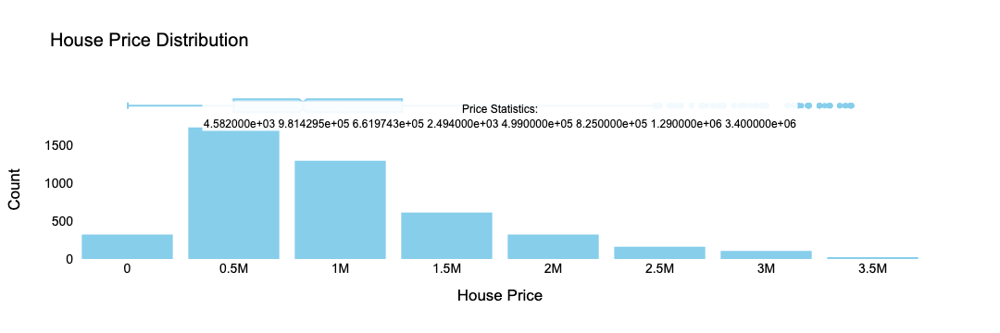

In [30]:
# Compute descriptive statistics for house prices
price_stats = df['PRICE'].describe()

# Visualize using Plotly
fig = px.histogram(df, x='PRICE', nbins=10, title='House Price Distribution',
                   labels={'PRICE': 'House Price'},
                   marginal='box',  
                   color_discrete_sequence=['skyblue'])  

# Add price statistics as annotations
fig.add_annotation(
    x=0.5, y=0.95,  
    xref='paper', yref='paper',  
    text=f"Price Statistics:<br>{price_stats.to_string(index=False)}",  
    showarrow=False, 
    font=dict(size=12, color='black', family='Arial'),  
    bgcolor='rgba(255, 255, 255, 0.9)'  
)

# Update layout for better readability
fig.update_layout(
    bargap=0.1, 
    bargroupgap=0.05,  
    xaxis_title='House Price',  
    yaxis_title='Count', 
    font=dict(size=14, color='black', family='Arial'),  
    paper_bgcolor='rgba(255,255,255,0.8)',  
    plot_bgcolor='rgba(255,255,255,0.8)'  
)

# Display the plot
fig.show()


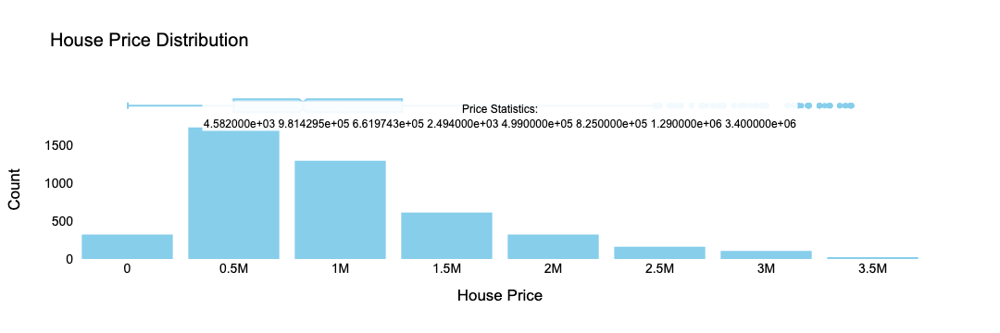

In [30]:
# Compute descriptive statistics for house prices
price_stats = df['PRICE'].describe()

# Visualize using Plotly
fig = px.histogram(df, x='PRICE', nbins=10, title='House Price Distribution',
                   labels={'PRICE': 'House Price'},
                   marginal='box',  
                   color_discrete_sequence=['skyblue'])  

# Add price statistics as annotations
fig.add_annotation(
    x=0.5, y=0.95,  
    xref='paper', yref='paper',  
    text=f"Price Statistics:<br>{price_stats.to_string(index=False)}",  
    showarrow=False, 
    font=dict(size=12, color='black', family='Arial'),  
    bgcolor='rgba(255, 255, 255, 0.9)'  
)

# Update layout for better readability
fig.update_layout(
    bargap=0.1, 
    bargroupgap=0.05,  
    xaxis_title='House Price',  
    yaxis_title='Count', 
    font=dict(size=14, color='black', family='Arial'),  
    paper_bgcolor='rgba(255,255,255,0.8)',  
    plot_bgcolor='rgba(255,255,255,0.8)'  
)

# Display the plot
fig.show()


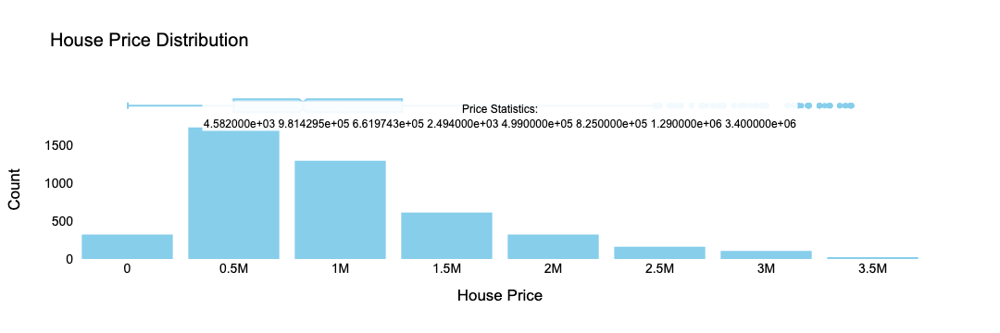

In [30]:
# Compute descriptive statistics for house prices
price_stats = df['PRICE'].describe()

# Visualize using Plotly
fig = px.histogram(df, x='PRICE', nbins=10, title='House Price Distribution',
                   labels={'PRICE': 'House Price'},
                   marginal='box',  
                   color_discrete_sequence=['skyblue'])  

# Add price statistics as annotations
fig.add_annotation(
    x=0.5, y=0.95,  
    xref='paper', yref='paper',  
    text=f"Price Statistics:<br>{price_stats.to_string(index=False)}",  
    showarrow=False, 
    font=dict(size=12, color='black', family='Arial'),  
    bgcolor='rgba(255, 255, 255, 0.9)'  
)

# Update layout for better readability
fig.update_layout(
    bargap=0.1, 
    bargroupgap=0.05,  
    xaxis_title='House Price',  
    yaxis_title='Count', 
    font=dict(size=14, color='black', family='Arial'),  
    paper_bgcolor='rgba(255,255,255,0.8)',  
    plot_bgcolor='rgba(255,255,255,0.8)'  
)

# Display the plot
fig.show()


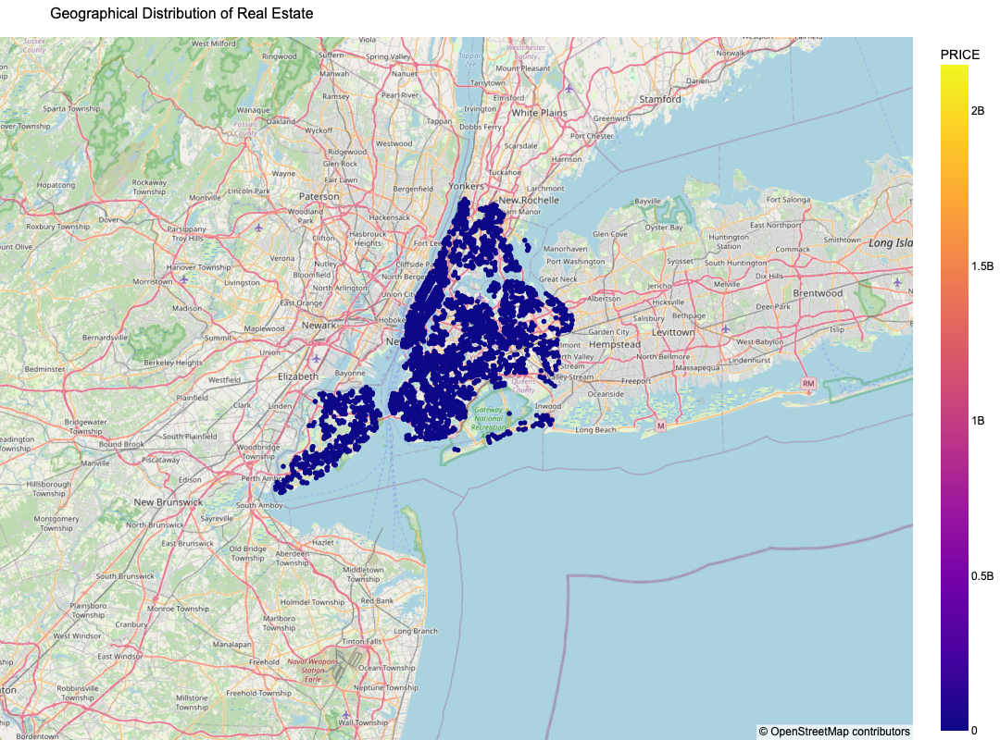

In [20]:
# Create the scatter map
fig = px.scatter_mapbox(
    df,
    lat="LATITUDE",
    lon="LONGITUDE",
    color="PRICE",  
    title="Geographical Distribution of Real Estate",
    hover_data={"ADDRESS": True, "PRICE": ":$.2f", "BEDS": True, "BATH": True},
    zoom=9
)

# Update layout and show the map
fig.update_layout(
    mapbox_style="open-street-map", 
    width=1200, 
    height=800,
    font=dict(family="Arial, sans-serif", size=12, color='black'), 
    title_font=dict(size=16, family="Arial, sans-serif", color='black'),  
    margin=dict(l=0, r=0, t=40, b=0)  
)
fig.show()


Plotting distributions:   0%|          | 0/4 [00:00<?, ?it/s]

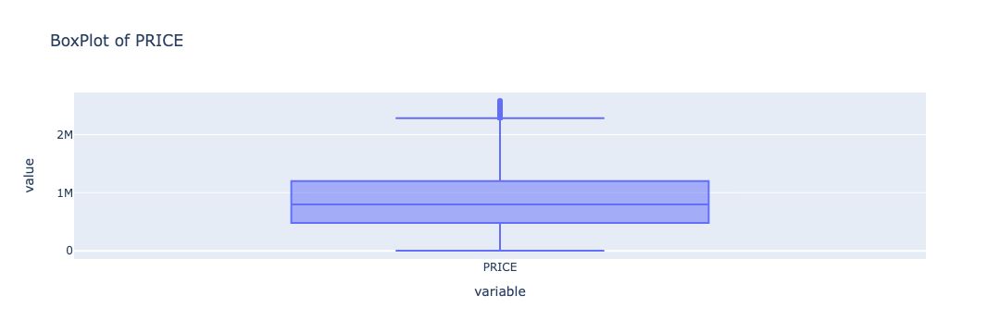

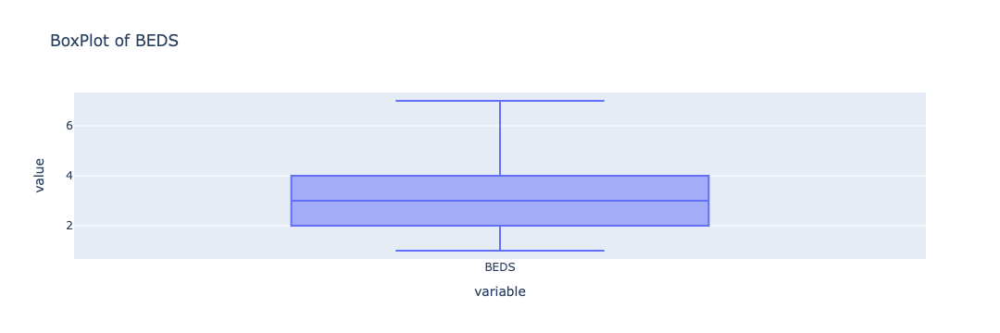

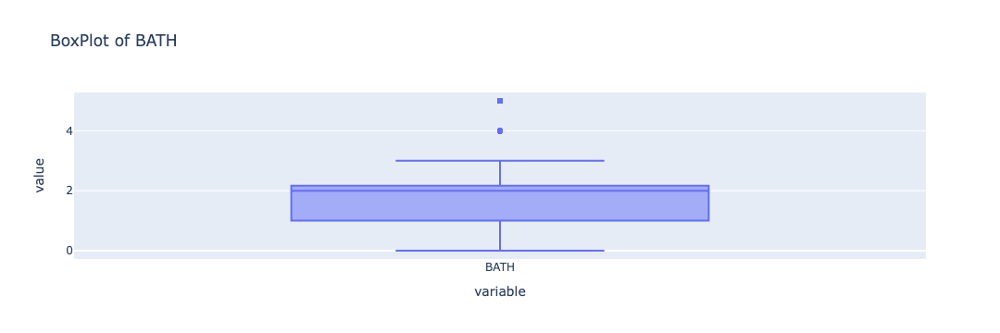

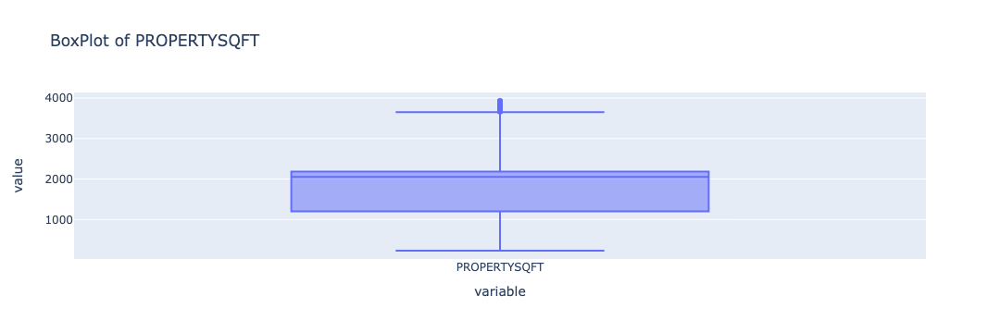

In [44]:
# Progress bar for the plots
for column in tqdm(numerical_columns, desc='Plotting distributions'):
    fig = px.box(df[column].dropna(), title='BoxPlot of ' + column)
    paper_bgcolor='lightblue'
    fig.show()

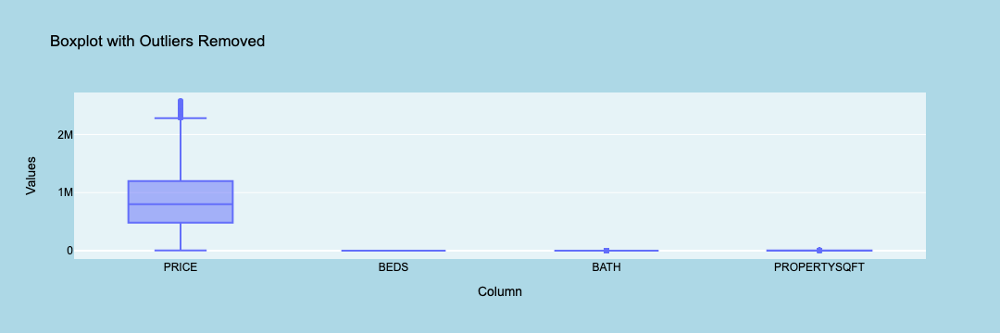

Cleaned Data Statistics:
              PRICE         BEDS         BATH  PROPERTYSQFT     LATITUDE  \
count  4.418000e+03  4582.000000  4582.000000   4553.000000  4582.000000   
mean   9.082607e+05     2.984842     2.054244   1805.874463    40.713996   
std    5.503340e+05     1.470025     1.003507    708.911100     0.087692   
min    2.494000e+03     1.000000     0.000000    230.000000    40.499546   
25%    4.799248e+05     2.000000     1.000000   1200.000000    40.638651   
50%    7.990000e+05     3.000000     2.000000   2052.000000    40.726691   
75%    1.200000e+06     4.000000     2.164731   2184.210000    40.771913   
max    2.580000e+06     7.000000     5.000000   3933.000000    40.912729   

         LONGITUDE  
count  4582.000000  
mean    -73.941501  
std       0.101214  
min     -74.253033  
25%     -73.987387  
50%     -73.949116  
75%     -73.869418  
max     -73.702450  


In [43]:
# Iterate through numerical columns
for column in numerical_columns:
    # Calculate Z-scores for the column
    z_scores = (df[column] - df[column].mean()) / df[column].std()

    # Define a threshold for outliers (e.g., Z-score > 3 or < -3)
    outliers = (z_scores > 3) | (z_scores < -3)

    # Replace outliers with NaN
    df[column] = df[column].mask(outliers)

# Descriptive statistics for the cleaned data
cleaned_stats = df.describe()

# Visualization using Plotly for the cleaned data
fig = px.box(df, y=numerical_columns, title='Boxplot with Outliers Removed',
             labels={'variable': 'Column', 'value': 'Value'})

# Update layout for better readability
fig.update_layout(
    yaxis_title='Values',
    font=dict(family="Arial, sans-serif", size=12, color='black'),
    paper_bgcolor='lightblue', 
    plot_bgcolor='rgba(255,255,255,0.7)'  
)

# Show the boxplot
fig.show()

# Show descriptive statistics for the cleaned data
print("Cleaned Data Statistics:")
print(cleaned_stats)


# PRICE PREDICTION

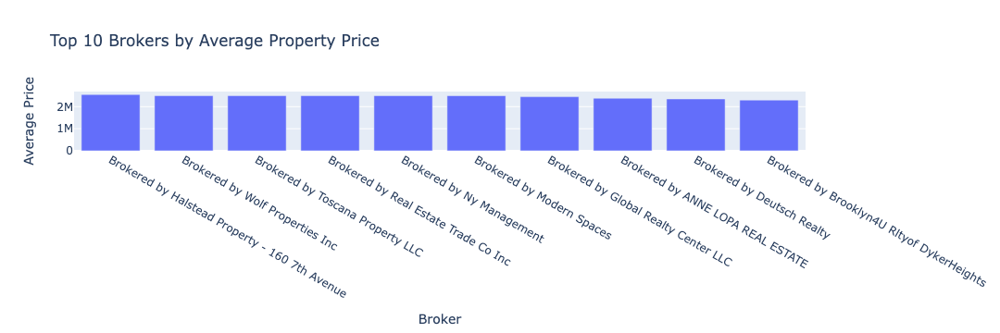

In [46]:
# Step 1: Group by broker and calculate the average price
broker_avg_prices = df.groupby('BROKERTITLE')['PRICE'].mean().sort_values(ascending=False)

# Step 2: Select the top 10 brokers
top_10_brokers = broker_avg_prices.head(10)

# Step 3: Create a bar chart to visualize the average prices for the top 10 brokers
fig = px.bar(
    top_10_brokers,
    x=top_10_brokers.index,  
    y='PRICE', 
    title='Top 10 Brokers by Average Property Price',
    labels={'PRICE': 'Average Price', 'BROKERTITLE': 'Broker'},
)

# Step 4: Show the chart
fig.show()

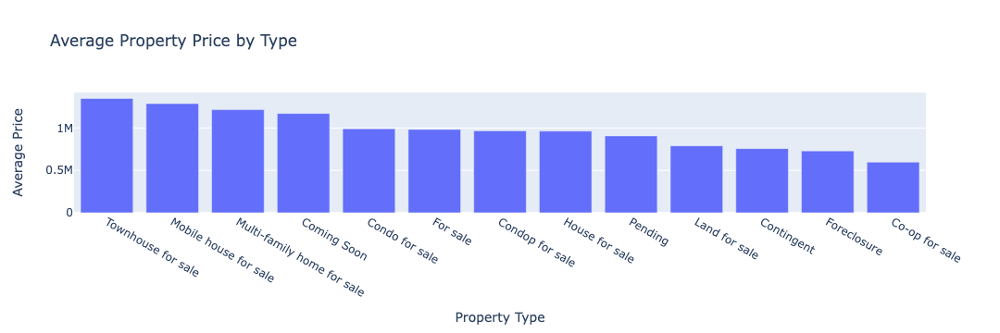

In [47]:
# Step 1: Group by property type and calculate the average price
type_avg_prices = df.groupby('TYPE')['PRICE'].mean().sort_values(ascending=False)

# Step 2: Create a bar chart to visualize the average prices for each property type
fig = px.bar(
    type_avg_prices.reset_index(),  
    x='TYPE',  
    y='PRICE', 
    title='Average Property Price by Type',
    labels={'PRICE': 'Average Price', 'TYPE': 'Property Type'},
)

# Step 3: Show the chart
fig.show()

In [51]:
# Step 1: Select features and target variable
features = ['LATITUDE', 'LONGITUDE', 'BEDS', 'BATH', 'PROPERTYSQFT']
target = 'PRICE'

# Step 2: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)

# Step 3: Handle missing values in features using SimpleImputer
imputer_features = SimpleImputer(strategy='mean')
X_train_imputed = pd.DataFrame(imputer_features.fit_transform(X_train), columns=X_train.columns)
X_test_imputed = pd.DataFrame(imputer_features.transform(X_test), columns=X_test.columns)

# Step 4: Handle missing values in the target variable using SimpleImputer
imputer_target = SimpleImputer(strategy='mean')
y_train_imputed = pd.Series(imputer_target.fit_transform(y_train.values.reshape(-1, 1)).ravel())
y_test_imputed = pd.Series(imputer_target.transform(y_test.values.reshape(-1, 1)).ravel())

# Step 5: Initialize and train the linear regression model
model = LinearRegression()
model.fit(X_train_imputed, y_train_imputed)

# Step 6: Make predictions on the test set
y_pred = model.predict(X_test_imputed)

# Step 7: Evaluate the model performance
meansquareerror = mean_squared_error(y_test_imputed, y_pred)
rootmeansquareerror = np.sqrt(meansquareerror)
print(f'Root Mean Squared Error: {rootmeansquareerror}')

# Now, we can start using the trained model for predictions
# For example, to predict the price for a new property:

# Replace these values with the actual values of the new property you want to predict
new_latitude = 40.789041  
new_longitude = -73.950480  
new_beds = 2 
new_bath = 1  
new_propertysqft = 10000  
new_property = pd.DataFrame([[new_latitude, new_longitude, new_beds, new_bath, new_propertysqft]],
                             columns=features)
new_property_imputed = pd.DataFrame(imputer_features.transform(new_property), columns=new_property.columns)
predicted_price = model.predict(new_property_imputed)
print(f'Predicted Price: {predicted_price[0]}')

Root Mean Squared Error: 423806.1027852285
Predicted Price: 1695765.5440320075


In [6]:
# Select numerical features for clustering
numerical_features = ['PRICE', 'BEDS', 'BATH', 'PROPERTYSQFT']

In [15]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[numerical_features])

In [16]:
kmeans = KMeans(n_clusters=3, random_state=42)
df['KMeans_Cluster'] = kmeans.fit_predict(scaled_data)

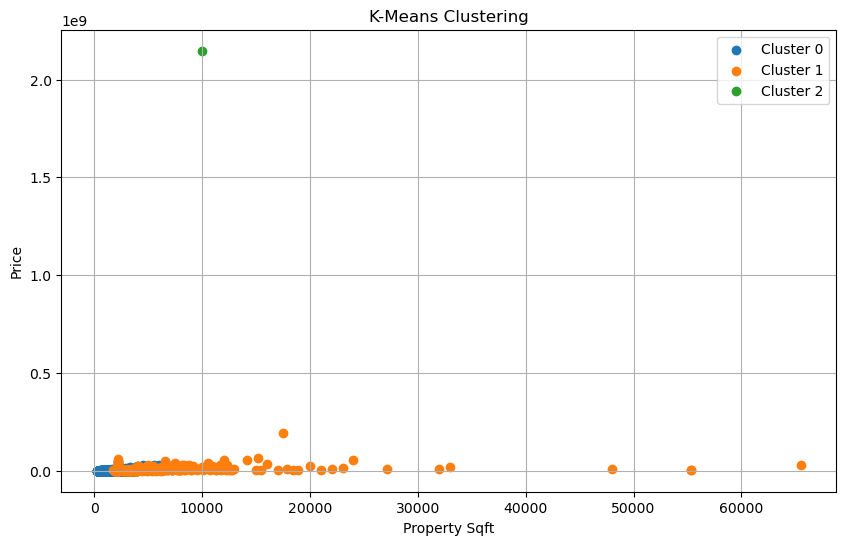

In [21]:
# Visualize K-Means clusters
plt.figure(figsize=(10, 6))
for cluster in df['KMeans_Cluster'].unique():
    cluster_data = df[df['KMeans_Cluster'] == cluster]
    plt.scatter(cluster_data['PROPERTYSQFT'], cluster_data['PRICE'], label=f'Cluster {cluster}')

plt.title('K-Means Clustering')
plt.xlabel('Property Sqft')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

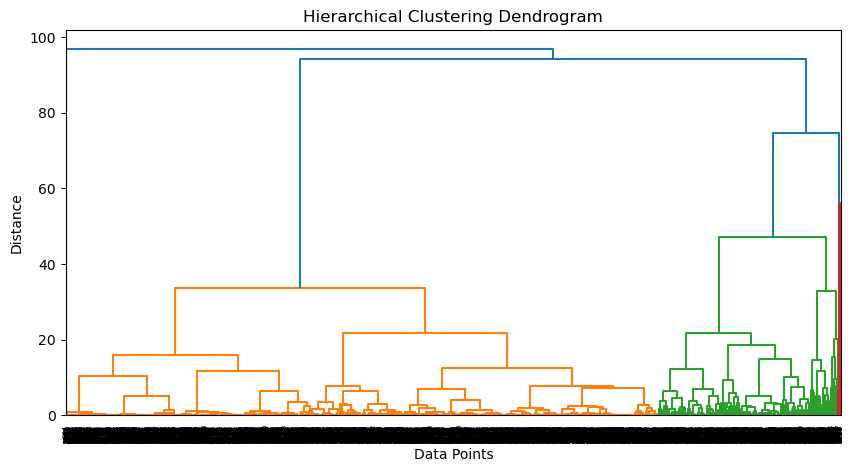

In [17]:
# 3. Hierarchical Clustering
Z = linkage(scaled_data, method='ward')
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Distance')
plt.show()

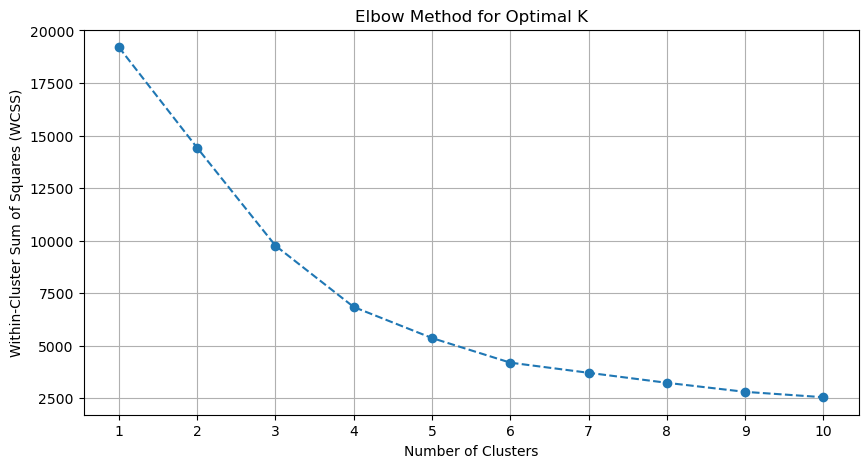

In [18]:
# 4. K-Means Model Parameter Study using Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(scaled_data)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(np.arange(1, 11, 1))
plt.grid(True)
plt.show()


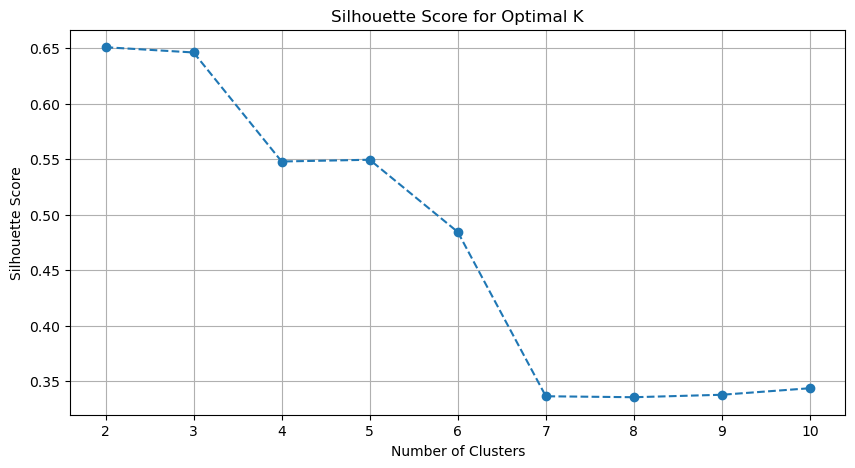

In [19]:
# 5. Silhouette Score for K-Means Clustering
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    silhouette_scores.append(silhouette_score(scaled_data, kmeans.labels_))

plt.figure(figsize=(10, 5))
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Score for Optimal K')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(np.arange(2, 11, 1))
plt.grid(True)
plt.show()

In [5]:
# Define the formula for ANOVA
formula = 'PRICE ~ BEDS + BATH + PROPERTYSQFT'

# Fit the ANOVA model
model = ols(formula, data=df).fit()

# Create ANOVA table
anova_table = sm.stats.anova_lm(model, typ=2)

# Print ANOVA table
print("ANOVA Table:")
print(anova_table)

ANOVA Table:
                    sum_sq      df          F        PR(>F)
BEDS          2.236459e+15     1.0   2.304786  1.290420e-01
BATH          6.131779e+15     1.0   6.319113  1.197682e-02
PROPERTYSQFT  3.354938e+16     1.0  34.574357  4.380698e-09
Residual      4.654790e+18  4797.0        NaN           NaN


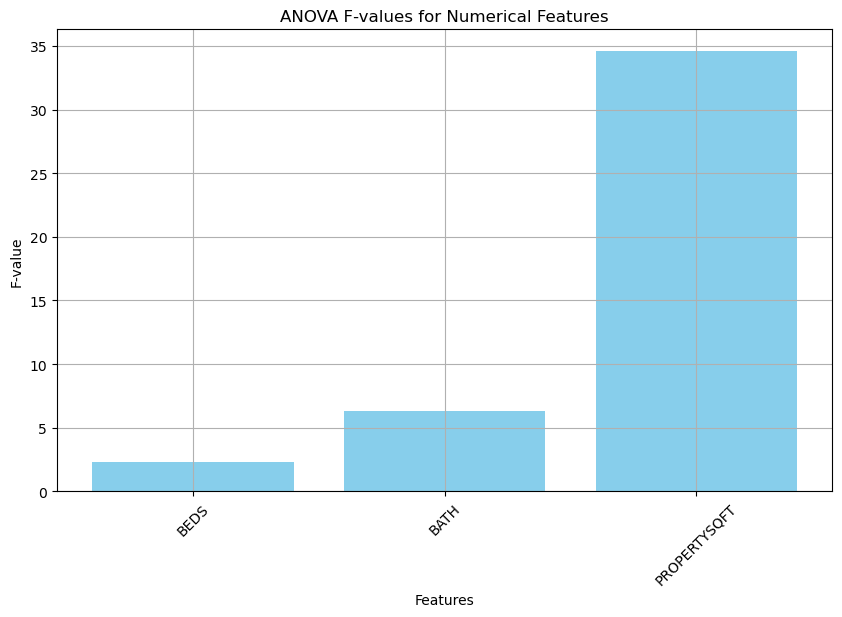

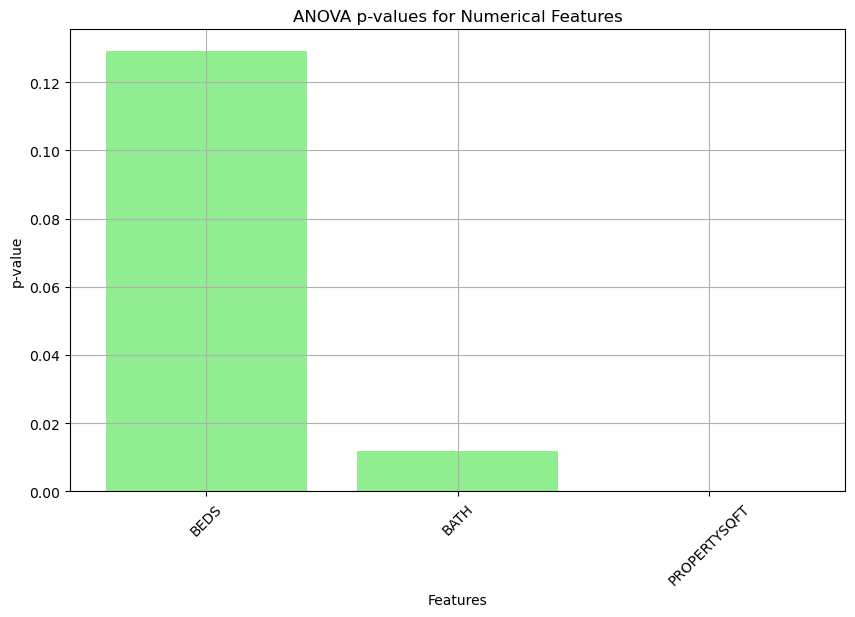

In [6]:
# Extract F-values and p-values from the ANOVA table
f_values = anova_table['F'].values
p_values = anova_table['PR(>F)'].values
features = anova_table.index.tolist()

# Plot the F-values
plt.figure(figsize=(10, 6))
plt.bar(features, f_values, color='skyblue')
plt.title('ANOVA F-values for Numerical Features')
plt.xlabel('Features')
plt.ylabel('F-value')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Plot the p-values
plt.figure(figsize=(10, 6))
plt.bar(features, p_values, color='lightgreen')
plt.title('ANOVA p-values for Numerical Features')
plt.xlabel('Features')
plt.ylabel('p-value')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()